## Application: Deforestation Analysis using Color Segmentation

Here, we are going to perform deforestation analysis, using both color channel and HSV segmentation.

We are going to be taking stellite imagery from Cancún Mexico over a number of years.

In [1]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["image.cmap"] = "gray"

## 1. Read Imges

We will use images from year 1985, 1993, 2001 and 2011 in this example. Let us read the images and see how much difference we can perceive.

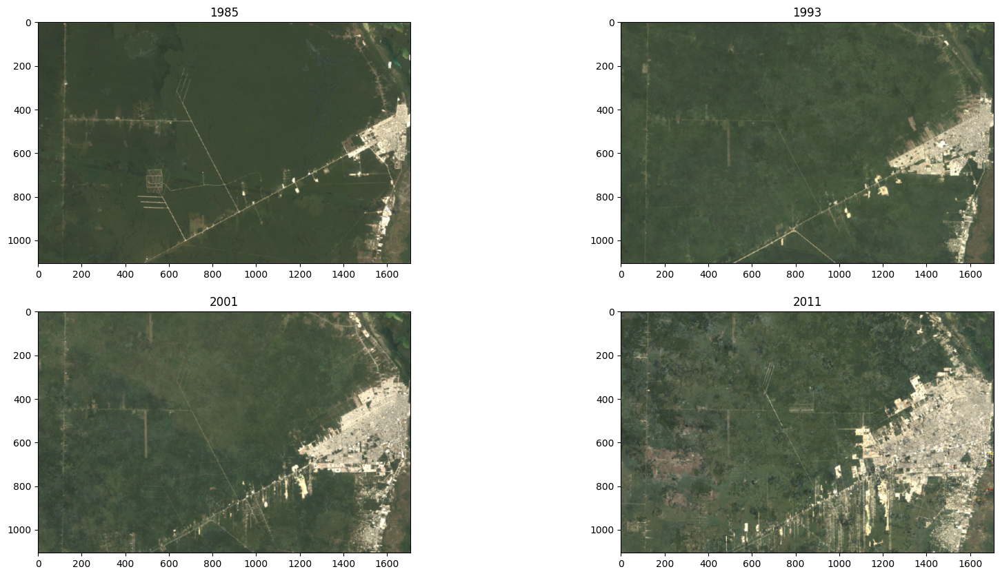

In [2]:
# Reading first screenshot.
image1 = cv2.imread("../module03/Applications/Images/1985.png", cv2.IMREAD_COLOR)
image2 = cv2.imread("../module03/Applications/Images/1993.png", cv2.IMREAD_COLOR)
image3 = cv2.imread("../module03/Applications/Images/2001.png", cv2.IMREAD_COLOR)
image4 = cv2.imread("../module03/Applications/Images/2011.png", cv2.IMREAD_COLOR)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(2, 2, 1)
ax.set_title("1985")
plt.imshow(image1[:, :, ::-1])

ax = fig.add_subplot(2, 2, 2)
ax.set_title("1993")
plt.imshow(image2[:, :, ::-1])

ax = fig.add_subplot(2, 2, 3)
ax.set_title("2001")
plt.imshow(image3[:, :, ::-1])

ax = fig.add_subplot(2, 2, 4)
ax.set_title("2011")
plt.imshow(image4[:, :, ::-1]);

## 2. View Channels

We can see that most of the image is green, with patches of creamy-white color. Also, the shade of green keeps changing over years. How do we find the forest area? Let us visualize the different channels.

We will check the channels for the year 1985 and 2011.

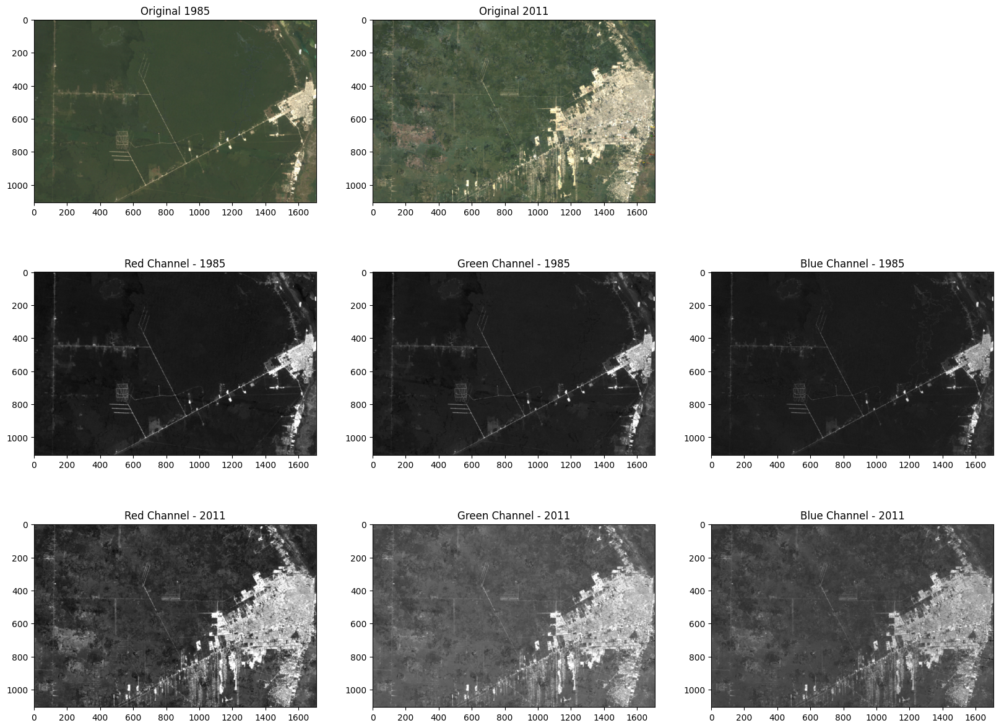

In [3]:
b1, g1, r1 = cv2.split(image1)
b4, g4, r4 = cv2.split(image4)

# Show the channels.
plt.figure(figsize=(20, 15))
plt.subplot(331); plt.imshow(image1[:, :, ::-1]); plt.title("Original 1985")
plt.subplot(332); plt.imshow(image4[:, :, ::-1]); plt.title("Original 2011")

plt.subplot(334); plt.imshow(r1); plt.title("Red Channel - 1985")
plt.subplot(335); plt.imshow(g1); plt.title("Green Channel - 1985")
plt.subplot(336); plt.imshow(b1); plt.title("Blue Channel - 1985")

plt.subplot(337); plt.imshow(r4); plt.title("Red Channel - 2011")
plt.subplot(338); plt.imshow(g4); plt.title("Green Channel - 2011")
plt.subplot(339); plt.imshow(b4); plt.title("Blue Channel - 2011");

## 3. Find Image Histograms

Since all of the images are BGR format, we will use 256 bins and plot the same. Let's see how it looks.

The reason to we want to see the histograms of these images it's because we want to pick the right values for our global threshold that we are going to be using later and instead of going back and forth testing different values, we can inspect the histogram to decide exactly the best values to use.

#### 3.1 Plotting linear and logarithmic histograms

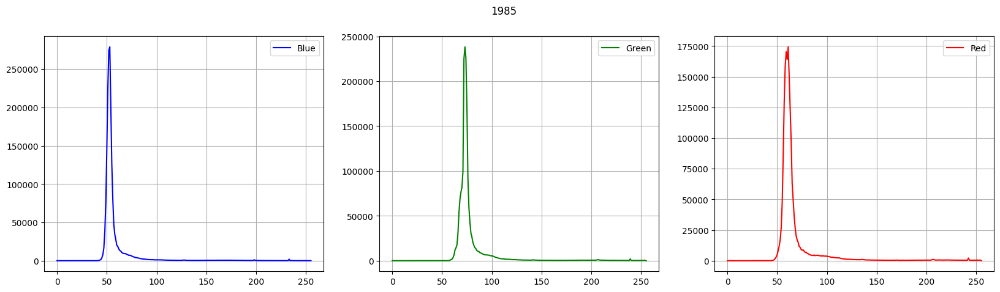

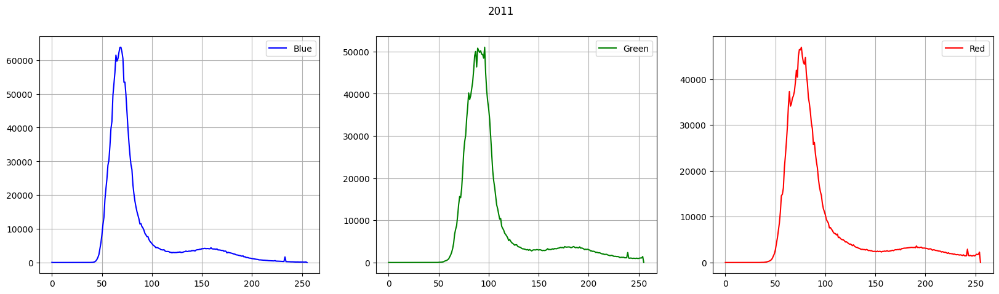

In [4]:
def draw_image_histogram_bgr(image, title="", yscale="linear"):
    """Utility to plot bgr histograms for all color channels independently."""
    histB = cv2.calcHist([image], [0], None, [256], [0, 255])
    histG = cv2.calcHist([image], [1], None, [256], [0, 255])
    histR = cv2.calcHist([image], [2], None, [256], [0, 255])
    
    # Plot the histogram for each channel.
    fig = plt.figure(figsize=(20, 5))
    fig.suptitle(title)
    
    ax = fig.add_subplot(1, 3, 1)
    ax.set_yscale(yscale)
    plt.plot(histB, color="b", label="Blue")
    ax.grid()
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 2)
    ax.set_yscale(yscale)
    plt.plot(histG, color="g", label="Green")
    ax.grid()
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 3)
    ax.set_yscale(yscale)
    plt.plot(histR, color="r", label="Red")
    ax.grid()
    ax.legend()
    
    plt.show()

# Calculate and draw the histograms for the images.
draw_image_histogram_bgr(image1, "1985")
draw_image_histogram_bgr(image4, "2011")

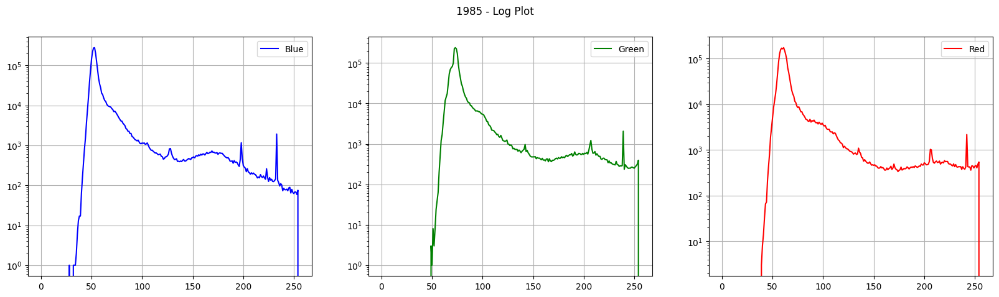

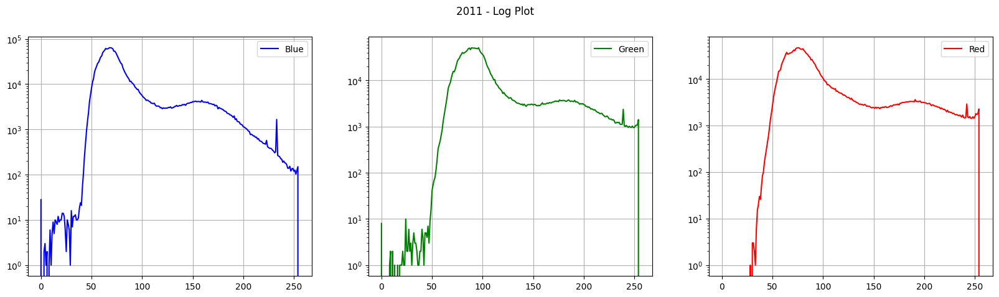

In [5]:
# Display the Log plots.
draw_image_histogram_bgr(image1, "1985 - Log Plot", "log")
draw_image_histogram_bgr(image4, "2011 - Log Plot", "log");

In [6]:
def detect_green_BGR(img):
    """Detect and return a mask for the green area of an image using BGR segmentation."""
    lower_BGR_values = np.array([0, 50, 0], dtype="uint8")
    upper_BGR_values = np.array([255, 100, 255], dtype="uint8")
    
    # Create a mask using the lower and upper range.
    mask_BGR = cv2.inRange(img, lower_BGR_values, upper_BGR_values)
    
    return mask_BGR

## 5. Detect and Plot Segmented Output

We will display the result for the segmentation obtained using the above function.

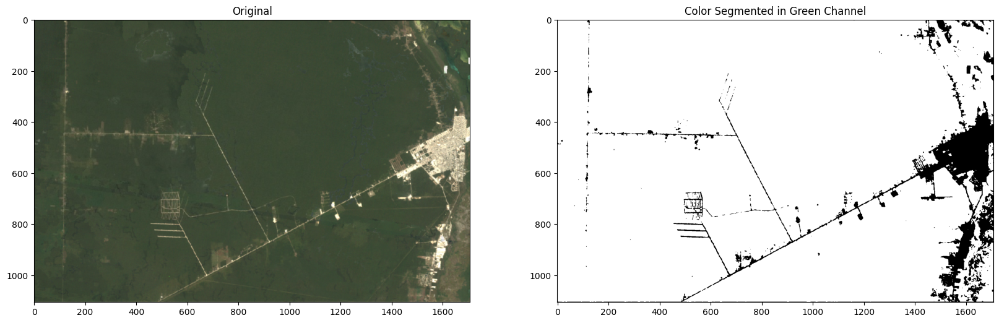

In [7]:
segmented_green = detect_green_BGR(image1)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(image1[:, :, ::-1])
ax.set_title("Original")

ax = fig.add_subplot(1, 2, 2)
plt.imshow(segmented_green, cmap="gray")
ax.set_title("Color Segmented in Green Channel")

plt.show()

## 6. Find percentage of non-zero pixels

We will use this function to compute the percentage of green pixels in the image. We will use the function **countNonZero** to find the non zero pixels and then divide the number with the total number of pixels in the image. This gives us the percentage of non-zero pixels in the image.

In [8]:
def percent_forest(gray_img):
    """Return the percentage of the image detected to be forested."""
    c = cv2.countNonZero(gray_img)
    
    # Finding number of pixels in image to find percentage
    t = gray_img.shape[0] * gray_img.shape[1]
    
    # Rounding off to 2 decimal place.
    return round((c / t) * 100, 2)

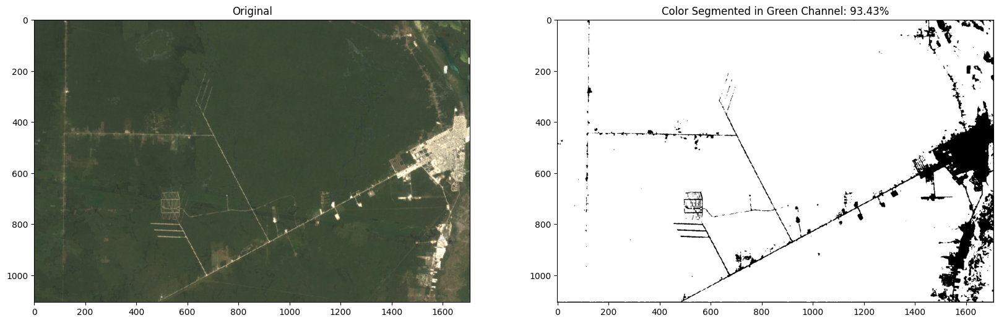

In [9]:
segmented_green = detect_green_BGR(image1)
green_ratio = percent_forest(segmented_green)

fig = plt.figure(figsize=(20, 20))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(image1[:, :, ::-1])
ax.set_title("Original")

ax = fig.add_subplot(1, 2, 2)
plt.imshow(segmented_green, cmap="gray")
ax.set_title("Color Segmented in Green Channel: " + str(green_ratio) + "%")

plt.show()

## 7. Check for all images

Now, let us check the percentage greenery in some more images. We will use 4 images taken from 1985, 1993, 2001, and 2011.

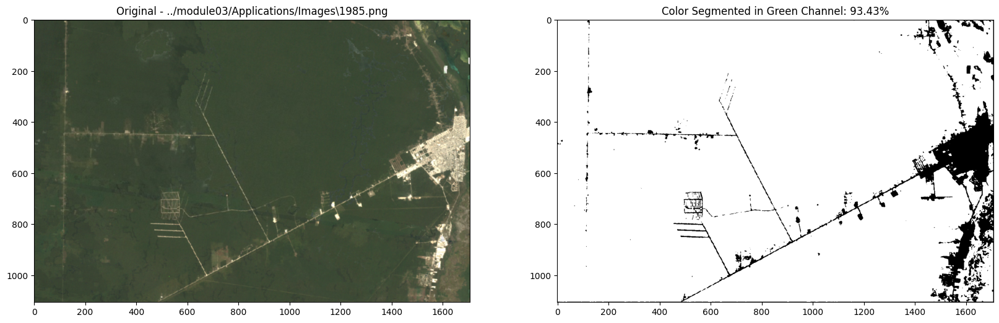

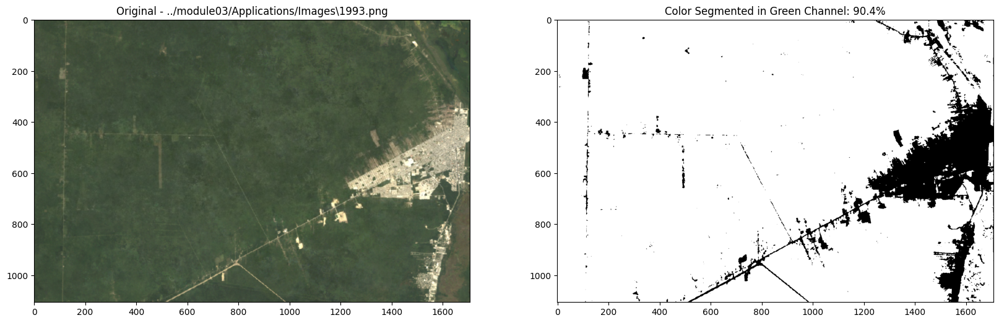

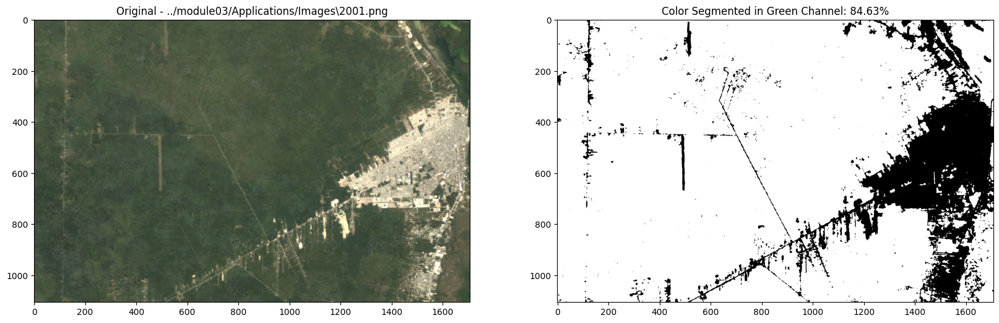

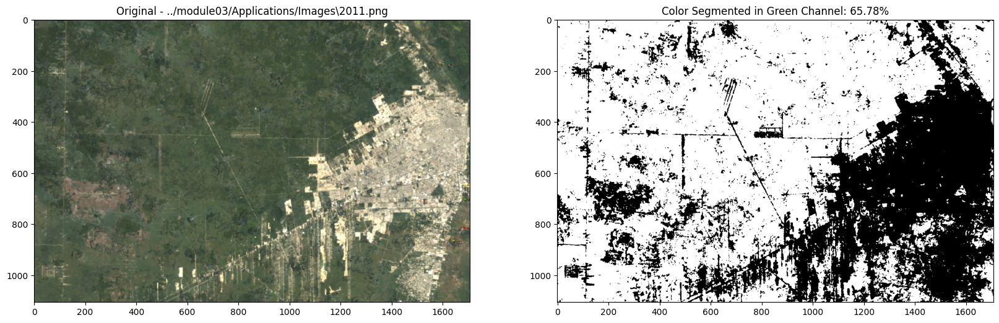

In [11]:
image_files = glob.glob("../module03/Applications/Images/*.png")
image_files.sort()

for image_file in image_files:
    image = cv2.imread(image_file)
    
    segmented_green = detect_green_BGR(image)
    green_ratio = percent_forest(segmented_green)
    
    fig = plt.figure(figsize=(20, 20))
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(image[:, :, ::-1])
    ax.set_title("Original - " + image_file)
    
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(segmented_green, cmap="gray")
    ax.set_title("Color Segmented in Green Channel: " + str(green_ratio) + "%")
    
    plt.show()

## 8. Analysis using the HSV Color Space

Another approach to this segmentation problem is to use the HSV color space to isolate the range of hue values representing the forested areas.

In [12]:
def draw_image_histogram_hsv(image, title="", yscale="linear"):
    """Utility to plot histograms for the hue, sturation, value channels independently."""
    HSV_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV) 
    
    histH = cv2.calcHist([HSV_image], [0], None, [256], [0, 255])
    histS = cv2.calcHist([HSV_image], [1], None, [256], [0, 255])
    histV = cv2.calcHist([HSV_image], [2], None, [256], [0, 255])
    
    # Plot the histograms for each channel.
    fig = plt.figure(figsize=(20, 5))
    plt.suptitle(title)
    
    ax = fig.add_subplot(1, 3, 1)
    ax.set_yscale(yscale)
    plt.plot(histH, color="b", label="Hue")
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 2)
    ax.set_yscale(yscale)
    plt.plot(histS, color="g", label="Saturation")
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 3)
    ax.set_yscale(yscale)
    plt.plot(histV, color="r", label="Value")
    ax.legend()
    
    plt.show()

### 8.1 Detect Segmented area from HSV Image

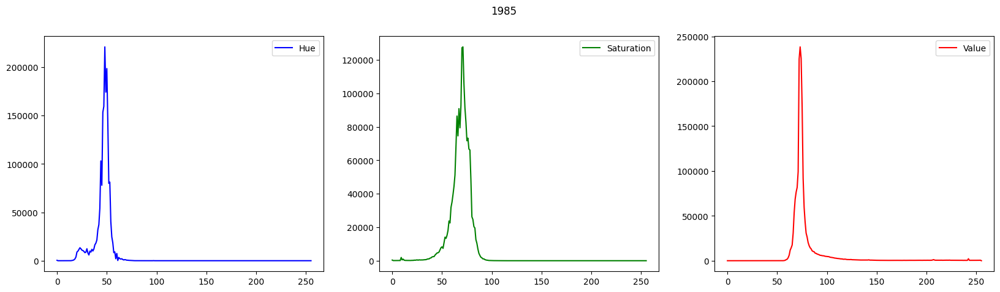

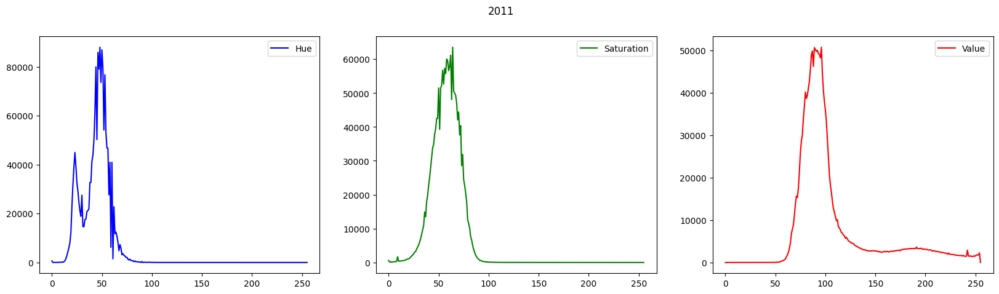

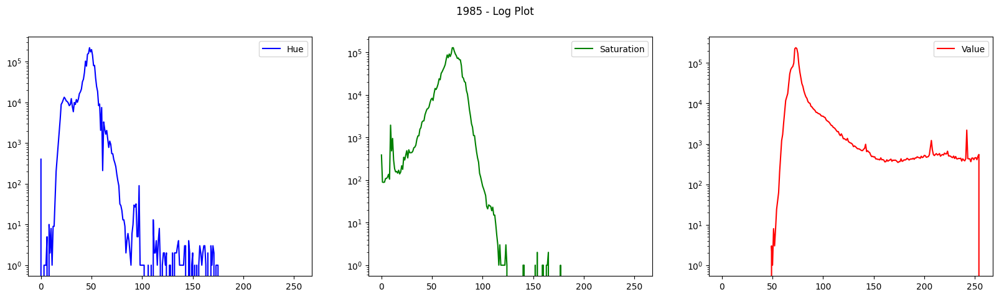

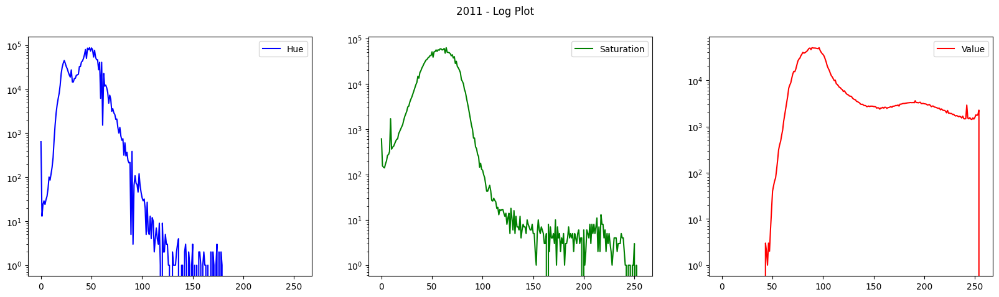

In [13]:
# Calculate and draw the histograms for the images.
draw_image_histogram_hsv(image1, "1985")
draw_image_histogram_hsv(image4, "2011")

# Display the Log plots.
draw_image_histogram_hsv(image1, "1985 - Log Plot", "log")
draw_image_histogram_hsv(image4, "2011 - Log Plot", "log");

### 8.2 Compute and compare with BGR

In [16]:
def detect_green_HSV(img):
    """Detect and return a mask for the green area of an image using HSV segmentation."""
    HSV_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    lower_HSV_values = np.array([36, 0, 50], np.uint8)
    upper_HSV_values = np.array([86, 250, 100], np.uint8)
    
    mask_HSV = cv2.inRange(HSV_image, lower_HSV_values, upper_HSV_values)
    
    return mask_HSV

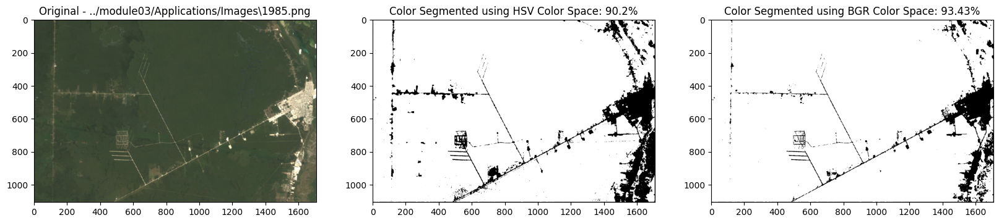

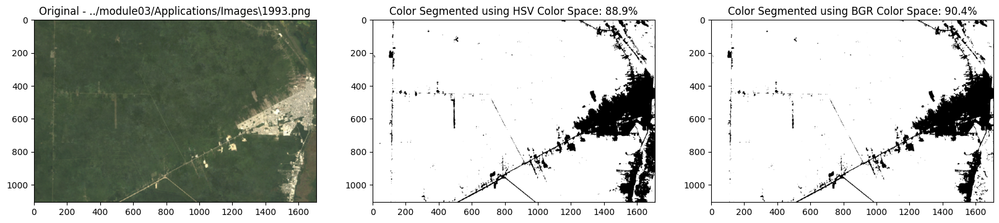

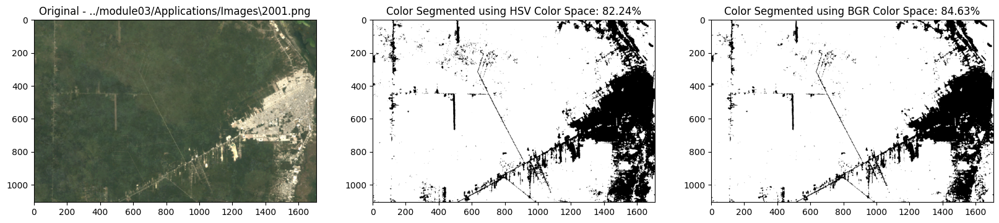

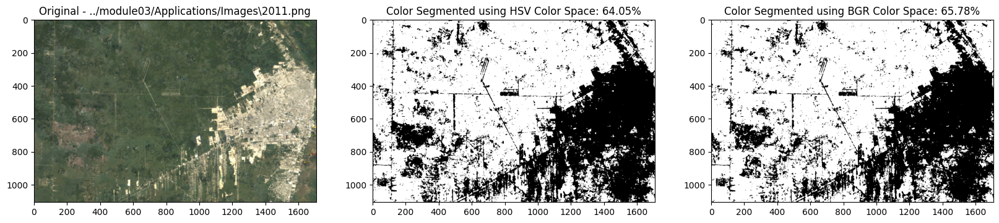

In [17]:
image_files = glob.glob("../module03/Applications/Images/*.png")
image_files.sort()

for image_file in image_files:
    image = cv2.imread(image_file)
    
    segmented_green_hsv = detect_green_HSV(image)
    green_ratio_hsv = percent_forest(segmented_green_hsv)
    
    sengmented_green_bgr = detect_green_BGR(image)
    green_ratio_bgr = percent_forest(sengmented_green_bgr)
    
    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(1, 3, 1)
    plt.imshow(image[:, :, ::-1])
    ax.set_title("Original - " + image_file)
    
    ax = fig.add_subplot(1, 3, 2)
    plt.imshow(segmented_green_hsv, cmap="gray")
    ax.set_title("Color Segmented using HSV Color Space: " + str(green_ratio_hsv) + "%")
    
    ax = fig.add_subplot(1, 3, 3)
    plt.imshow(sengmented_green_bgr, cmap="gray")
    ax.set_title("Color Segmented using BGR Color Space: " + str(green_ratio_bgr) + "%")
    
    plt.show()